<div style="text-align: center;">
<h1>Разведочный анализ данных 1/2</h1>
</div>

<div style="text-align: right;">
<h4>Основной датасет &nbsp;&nbsp;&nbsp;&nbsp;</h4>
</div>

```
Всего объявлений: 37441
Минимальное число картинок в объявлении: 1
Больше одной картинки в объявлении: 32839
Среднее число картинок в объявлении: 3.13
Максимальное число картинок в объявлении: 5
Чаще всего встречается число картинок: 3 шт., 9829 раз
Всего картинок: 117329
```

## Импорты, константы

In [1]:
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json
import random
from natasha import Doc, MorphVocab, Segmenter, NewsEmbedding, NewsMorphTagger
from collections import Counter
import matplotlib.image as mpimg
import torch
from wordcloud import WordCloud

In [2]:
DATASET_PATH = '/workspace/AAA_project/data/main_dataset'
IMAGES = os.path.join(DATASET_PATH, 'images')
META = os.path.join(DATASET_PATH, 'meta_info.csv')

In [3]:
RANDOM_STATE = 42

In [4]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

if DEVICE == 'cuda':
    print('Using GPU')
else:
    print('T_T Using CPU')

Using GPU


In [5]:
segmenter = Segmenter()
morph_vocab = MorphVocab()
emb = NewsEmbedding()
morph_tagger = NewsMorphTagger(emb)

def lemmatize_text(text: str) -> str:
    '''
    Функция лемматизации с использованием Natasha

    Parameters
    ----------
    text : str
        Текст для лемматизации

    Returns
    -------
    str
        Лемматизированный текст
    '''
    doc = Doc(text)
    doc.segment(segmenter)
    doc.tag_morph(morph_tagger)
    for token in doc.tokens:
        token.lemmatize(morph_vocab)
    return ' '.join(token.lemma for token in doc.tokens if token.lemma.isalpha())

In [6]:
def display_ad(row: pd.Series, columns_to_display=None) -> None:
    '''
    Функция, выводящая объявление, его изображения и признаки
    
    Parameters
    ----------
    row : pd.Series
        Строка датасета, содержащая информацию об изображении и его признаках
    columns_to_display : list, optional
        Список признаков, которые нужно вывести. Если None, выводятся все признаки
    '''
    
    item_id = row['item_id']
    images = row['images']
    if isinstance(images, str):
        images = eval(images)
    
    fig, axes = plt.subplots(1, min(len(images), 9), figsize=(15, 5))
    if len(images) == 1:
        axes = [axes]
    
    for ax, image_id in zip(axes, images[:9]):
        image_path = os.path.join(IMAGES, f"{image_id}.jpg")
        if os.path.exists(image_path):
            img = mpimg.imread(image_path)
            ax.imshow(img)
            ax.set_title(f"{image_id}.jpg", fontsize=8)
            ax.axis('off')
        else:
            ax.set_title("Картинки не найдены", fontsize=8)
            ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    if columns_to_display is None:
        columns_to_display = row.index.tolist()
    
    for col in columns_to_display:
        if col in row:
            print(f"{col}: {row[col]}")

## Описание набора данных

Для начала загрузим основной датасет

In [7]:
df = pd.read_csv(META)

df

,item_id,title,description,attrs,images,category,other
0,1322715250286,Туфли Kapika р.30,Новые туфельки для девочки\n\nТМ Kapika \n\nВе...,"{'Вид одежды': 'Для девочек', 'Предмет одежды'...",[14797484977],(Ж) Обувь,"Туфли Kapika для девочек, размер 30 (19 см), в..."
1,1855325000254,Кеды adidas superstar детские,"Продаю кеды адидас, оригинал, покупались в офл...","{'Предмет одежды': 'Обувь', 'Вид одежды': 'Для...","[29690495353, 29690495386, 29690495401, 296904...",(М) Обувь,Продаю детские кеды adidas Superstar белого цв...
2,1779415000905,Кросовки 27 размер для девочки,Кросовки для девочки от Загадка в хорошем сост...,"{'Вид одежды': 'Для девочек', 'Предмет одежды'...","[27889651299, 27889651322, 27889651235, 278896...",(Ж) Обувь,"Яркие разноцветные кроссовки для девочки, разм..."
3,1817738751606,Crocs сабо детские35-36/3-5 оригинал,"Состояние отличное, дефект единственный на фот...","{'Вид одежды': 'Для девочек', 'Предмет одежды'...","[28909766974, 28909767030, 28909767120, 289097...",(Ж) Обувь,Продаются оригинальные детские сабо Crocs в яр...
4,1863482000525,Ботинки детские Tombi 26 размер,"Ботиночки Tombi,в стиле Timberland,очень удобн...","{'Предмет одежды': 'Обувь', 'Вид одежды': 'Для...","[29898615047, 29898615057, 29898615186]",(М) Обувь,"Продаются детские ботинки Tombi 26 размера, ко..."
...,...,...,...,...,...,...,...
37436,1663653000236,Кофточки 122,Кофточки для школы.\nЧерная с жемчугом и синяя...,"{'Вид одежды': 'Для девочек', 'Предмет одежды'...","[29413588886, 29413589167]",(Ж) Блузки и рубашки,Продаю стильные кофточки для девочек от бренда...
37437,1670162501379,Футболка и толстовка для мальчика 152см,Вещи пакетом на мальчика. На рост 152см. Вещи ...,"{'Предмет одежды': 'Футболки и майки', 'Вид од...","[26299714558, 29298404644, 29307635580, 293076...",(М) Футболки и майки,Продаю комплект одежды для мальчика на рост 15...
37438,1676625251053,Хлопковая фланелевая рубашка hm 68,Новая хлопковая фланелевая рубашка H&M 🇩🇪\n\nC...,"{'Предмет одежды': 'Рубашки', 'Вид одежды': 'Д...","[25538038858, 25538039948]",(М) Рубашки,Новая хлопковая фланелевая рубашка H&M для мал...
37439,1320192252110,Рубашка для мальчика 140,Рубашка голубого цвета длина рукава 51 ширина ...,"{'Предмет одежды': 'Рубашки', 'Вид одежды': 'Д...",[14744548373],(М) Рубашки,Продаётся новая голубая рубашка для мальчика. ...


In [8]:
print(f'Размерность датасета: {df.shape}')
print(f'Количество пропусков: {df.isnull().sum().sum()}')
print(f'Количество дубликатов: {df.duplicated().sum()}')
print(f'Уникальных item_id: {df["item_id"].nunique()}/{df.shape[0]}')

Размерность датасета: (37441, 7)
Количество пропусков: 0
Количество дубликатов: 0
Уникальных item_id: 37441/37441


In [9]:
import ast


print(f'Всего объявлений: {len(df)}')

image_counts = df['images'].fillna('[]').apply(lambda x: len(ast.literal_eval(x)))

print(f'Минимальное число картинок в объявлении: {image_counts.min()}')
print(f'Больше одной картинки в объявлении: {image_counts[image_counts > 1].count()}')
print(f'Среднее число картинок в объявлении: {image_counts.mean():.2f}')
print(f'Максимальное число картинок в объявлении: {image_counts.max()}')
print(f'Чаще всего встречается число картинок: {image_counts.mode().iloc[0]} шт., {(image_counts == image_counts.mode().iloc[0]).sum()} раз')
print(f'Всего картинок: {image_counts.sum()}')

Всего объявлений: 37441
Минимальное число картинок в объявлении: 1
Больше одной картинки в объявлении: 32839
Среднее число картинок в объявлении: 3.13
Максимальное число картинок в объявлении: 5
Чаще всего встречается число картинок: 3 шт., 9829 раз
Всего картинок: 117329


Познакомимся с его структурой и типами данных

Датасет состоит из 7 колонок:

| Название колонки      | Описание                        | Тип данных | Примеры значений                                          |
|-----------------------|---------------------------------|------------|-----------------------------------------------------------|
| `item_id`             | Уникальный идентификатор записи | int64      | 1322715250286, 1322715250287, ...                         |
| `title`               | Название объявления             | object     | 'Кроссовки Nike', 'Платье Zara', ...                      |
| `description`         | Описание объявления             | object     | 'Продаю кеды адидас, оригинал, покупались в офлайн магазине в эмиратах. Длина по стельке 17,5 см. Одевались несколько раз. В хорошем состоянии.', 'Состояние отличное, дефект единственный на фото-заклепка потерта с обеих сторон, компенсирую парой джибитсов. \nПересылаю! \nОригинал!!!' |
| `attrs`               | Атрибуты объявления             | object     | "{'Вид одежды': 'Для девочек', 'Предмет одежды': 'Обувь', 'Состояние': 'Новый', 'Вид объявления': 'Товар приобретён на продажу', 'Цвет': 'Синий', 'Размер': '30 (19 см)', 'Бренд одежды': 'Kapika', 'Вид обуви': 'Туфли и босоножки', 'Тип обуви': 'Туфли'}", "{'Предмет одежды': 'Обувь', 'Вид одежды': 'Для мальчиков', 'Состояние': 'Б/у', 'Вид объявления': 'Продаю своё', 'Цвет': 'Белый', 'Размер': '28 (17,5 см)', 'Бренд одежды': 'Adidas', 'Вид обуви': 'Кроссовки и кеды', 'Тип обуви': 'Кеды'}" |
| `images`              | Изображения объявления          | object     | '[28909766974, 28909767030, 28909767120, 28909767144]', '[27865611311]' ... |
| `category`            | Категория объявления            | object     | '(Ж) Обувь', '(Ж) Пиджаки и костюмы', ... |
| `other`               | Описание объявления (GPT4)      | object     | "Дополнительная информация", ... |


## Предобработка и первичный анализ

Будем идти по колонкам, изучая особенности данных в них и выявляя возможные проблемы

### Категории объявлений (`category`)

Уникальные значения в колонке `category`:

In [10]:
for cat in df['category'].unique():
    print(cat)

(Ж) Обувь
(М) Обувь
(М) Комбинезоны
(Ж) Комбинезоны
(Ж) Верхняя одежда
(М) Верхняя одежда
(Ж) Платья и юбки
(М) Пиджаки и костюмы
(Ж) Пиджаки и костюмы
(М) Брюки
(Ж) Брюки
(М) Свитеры и толстовки
(Ж) Свитеры и толстовки
(Ж) Блузки и рубашки
(М) Рубашки
(Ж) Футболки и топы
(М) Футболки и майки


Видим, что нам предоставлен набор данных только для одежды, полученная модель будет плохо работать на других категориях товаров.

Также в названии категории указано, для какого пола предназначена одежда. Например, (Ж) - для женщин, (М) - для мужчин. 

Видим, что некоторые категории имеют разные названия в зависимости от пола.

Например: 

- (Ж) Платья и юбки - уникальная категория для женщин

- (Ж) Блузки и рубашки == (М) Рубашки
- (Ж) Футболки и топы == (М) Футболки и майки

Видим, что ошибок в наименованиях нет

Напишем словари для замен

In [11]:
CAT_MAP = {
    '(Ж) Обувь': '(МЖ) Обувь',
    '(М) Обувь': '(МЖ) Обувь',
    '(М) Комбинезоны': '(МЖ) Комбинезоны',
    '(Ж) Комбинезоны': '(МЖ) Комбинезоны',
    '(Ж) Верхняя одежда': '(МЖ) Верхняя одежда',
    '(М) Верхняя одежда': '(МЖ) Верхняя одежда',
    '(Ж) Платья и юбки': '(Ж) Платья и юбки',
    '(М) Пиджаки и костюмы': '(МЖ) Пиджаки и костюмы',
    '(Ж) Пиджаки и костюмы': '(МЖ) Пиджаки и костюмы',
    '(М) Брюки': '(МЖ) Брюки',
    '(Ж) Брюки': '(МЖ) Брюки',
    '(М) Свитеры и толстовки': '(МЖ) Свитеры и толстовки',
    '(Ж) Свитеры и толстовки': '(МЖ) Свитеры и толстовки',
    '(Ж) Блузки и рубашки': '(М) Рубашки',
    '(М) Рубашки': '(М) Рубашки',
    '(Ж) Футболки и топы': '(М) Футболки и майки',
    '(М) Футболки и майки': '(М) Футболки и майки'
}

SEX_MAP = {
    '(Ж) Обувь': 'Ж',
    '(М) Обувь': 'М',
    '(М) Комбинезоны': 'М',
    '(Ж) Комбинезоны': 'Ж',
    '(Ж) Верхняя одежда': 'Ж',
    '(М) Верхняя одежда': 'М',
    '(Ж) Платья и юбки': 'Ж',
    '(М) Пиджаки и костюмы': 'М',
    '(Ж) Пиджаки и костюмы': 'Ж',
    '(М) Брюки': 'М',
    '(Ж) Брюки': 'Ж',
    '(М) Свитеры и толстовки': 'М',
    '(Ж) Свитеры и толстовки': 'Ж',
    '(Ж) Блузки и рубашки': 'Ж',
    '(М) Рубашки': 'М',
    '(Ж) Футболки и топы': 'Ж',
    '(М) Футболки и майки': 'М'
}

Построим график распределения категорий

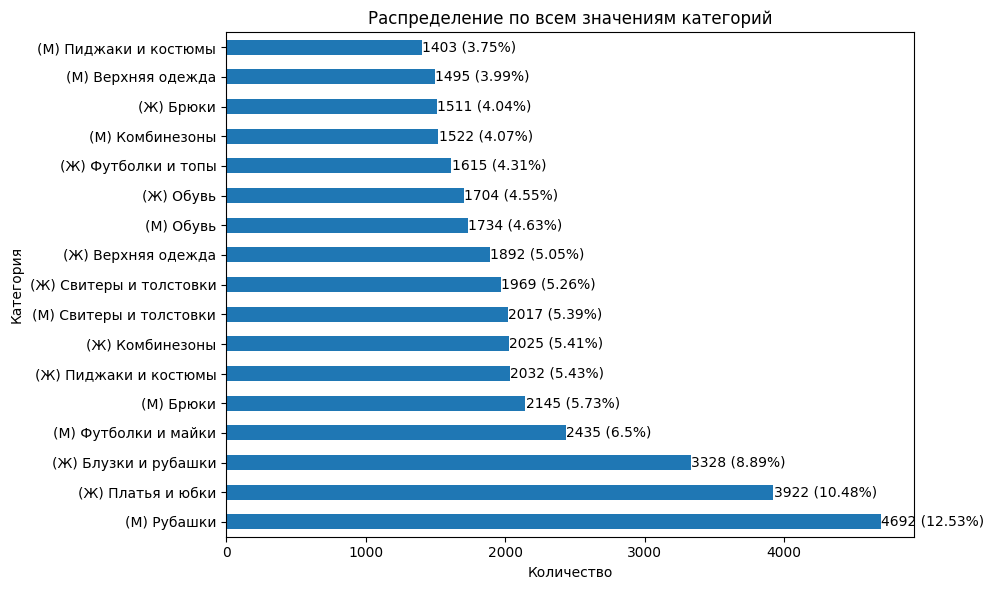

In [12]:
plt.figure(figsize=(10, 6))
category_counts = df['category'].value_counts()
category_percentages = (category_counts / len(df) * 100).round(2)
ax = category_counts.plot(kind='barh')
for i, (count, percentage) in enumerate(zip(category_counts, category_percentages)):
    ax.text(count + 1, i, f'{count} ({percentage}%)', va='center')
plt.title('Распределение по всем значениям категорий')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.tight_layout()
plt.show()

На графике видно, что категории распределены неравномерно. Наиболее популярной категорией является "(М) Рубашки", которая составляет 12.53% от общего числа записей. 

Рядом с ней идут "(Ж) Платья и юбки" (10.48%) и "(Ж) Блузки и рубашки" (8.89%).

Далее идет резкое падение до 6.5%, далее идет плавный спад до 3.75%.

Наименее популярной категорией является "(М) Пиджаки и костюмы" с долей 3.75%. 

Делаем вывод, что по категориям имеется сильный дисбаланс.

Построим график распределения категорий без учета пола

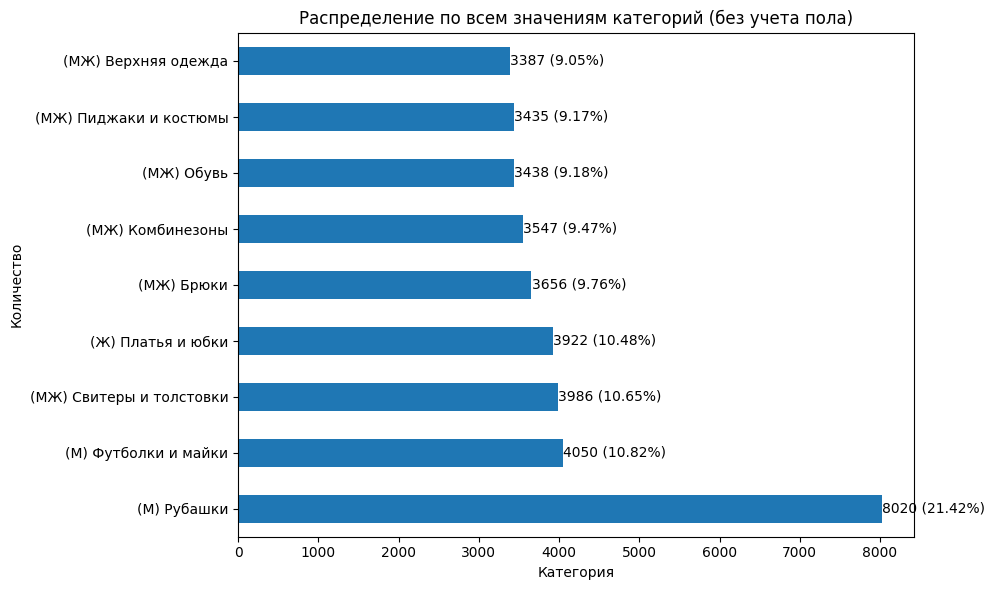

In [13]:
plt.figure(figsize=(10, 6))
category_counts = df['category'].replace(CAT_MAP).value_counts()
category_percentages = (category_counts / len(df) * 100).round(2)
ax = category_counts.plot(kind='barh')
for i, (count, percentage) in enumerate(zip(category_counts, category_percentages)):
    ax.text(count + 1, i, f'{count} ({percentage}%)', va='center')
plt.title('Распределение по всем значениям категорий (без учета пола)')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.tight_layout()
plt.show()

На графике видно, что больше всего записей у уникальной категоии "(М) Рубашки", которая составляет 21% от общего числа записей.

Далее идет резкое падение до 10.82%, без стремительного понижения, до 9%. 

На этом стабильном участке встречаются две уникальные категории - "(М) Футболки и майки" и "(Ж) Платья и юбки".
Остальные категории участка - не уникальные, встречаются как в женской, так и в мужской одежде.

Посмотрим на распредление полов

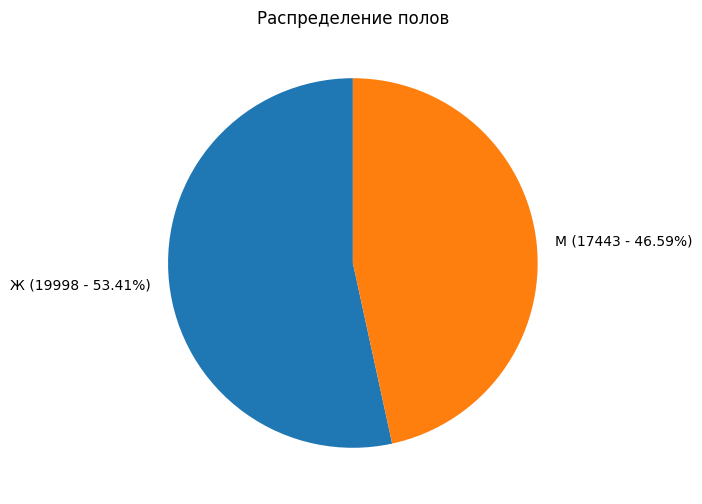

In [14]:
plt.figure(figsize=(12, 6))
sex_counts = df['category'].replace(SEX_MAP).value_counts()
sex_percentages = (sex_counts / len(df) * 100).round(2)
plt.pie(sex_counts,
        labels=[f"{label} ({count} - {percentage}%)" for label, count, percentage in zip(sex_counts.index, sex_counts, sex_percentages)],
        autopct='', startangle=90)
plt.title('Распределение полов')
plt.show()

Видим, что в датасете нет дисбаланса по полу.

### Описания объявлений (`description`, `other`)

Посмотрим на некоторые примеры описаний объявлений

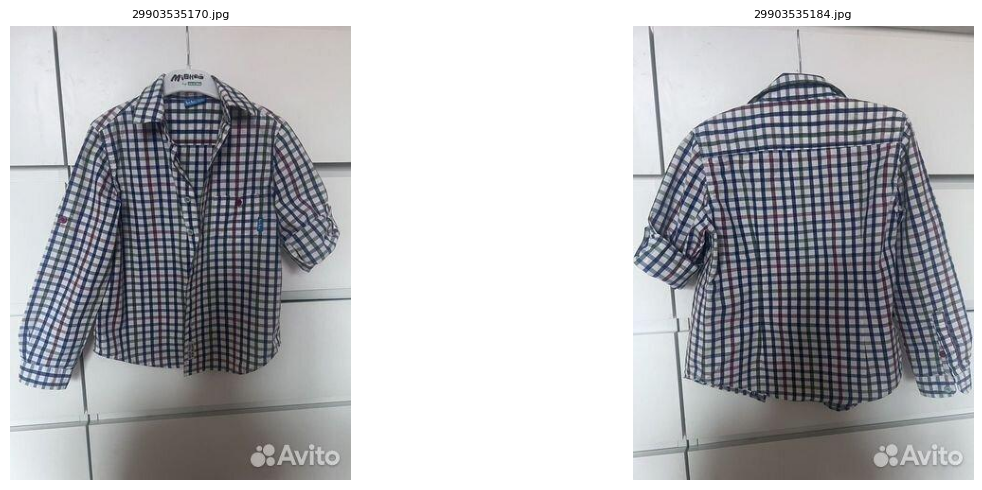

description: Рубашка в клетку для мальчика размер 110. Состояние идеальное, надевали несколько раз. Рукава длинные , а можно подвернуть и зафиксировать.
other: Стильная рубашка в клетку для мальчика, размер 110 см, от бренда Button Blue. Синий цвет с ярким клетчатым узором придаёт ей особый шарм. Рубашка надевалась всего несколько раз, поэтому сохранила идеальное состояние. Длинные рукава можно подвернуть и зафиксировать, что добавляет удобства.


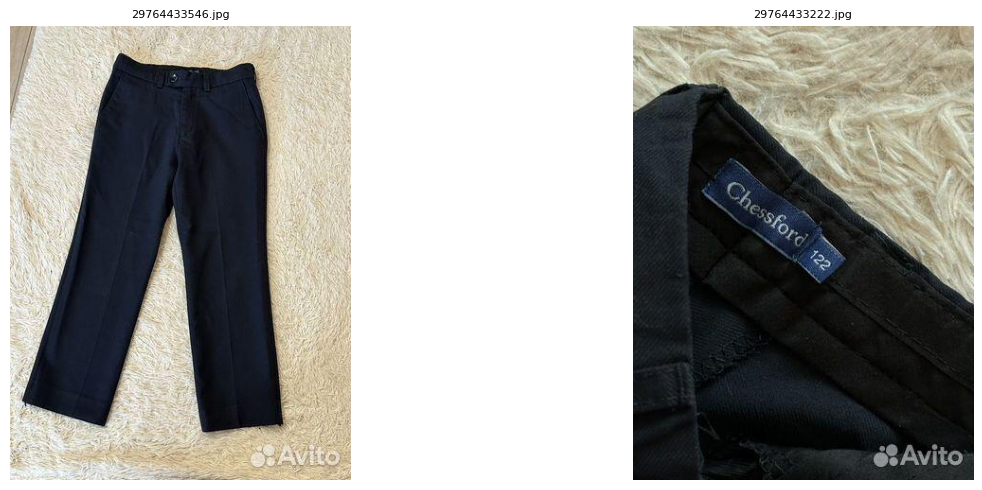

description: Продам школьные брюки для мальчика на рост 122 см в хорошем состоянии. Цвет темно синий.
Колени и тд все целое не вытянутое. Ребенок носил аккуратно. 
Две пары одинаковых. Каждая пара по 600₽
other: Продаются школьные брюки для мальчика на рост 122 см. Цвет насыщенный синий, классический крой. Брюки в хорошем состоянии, без повреждений и следов износа. Материал плотный и приятный на ощупь. Подойдут для повседневной носки.


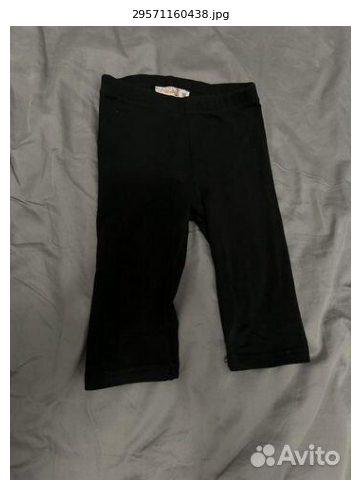

description: В отличном состоянии, дочка носила на физкультуру в садике. Длина ниже колена, эластичные. Могу отдать в подарок при покупке любой вещи
other: Лосины FOX для детей 3 лет, размер 98 см. Эластичные и удобные, длина ниже колена. Подойдут для активных игр и занятий. Состояние отличное, без видимых дефектов.


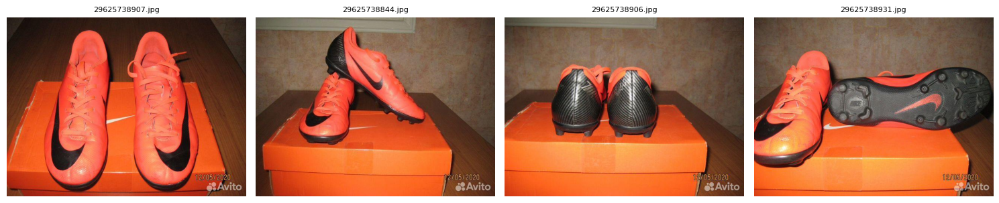

description: Футбольные бутсы для подростка Nike Mercurial. Оригинальные. 36 размер. Длина стельки примерно 22,5-23см. В очень хорошем состоянии. На узкую ногу.
other: Футбольные бутсы Nike Mercurial в ярком красном цвете, размер 36 (длина стельки 23 см). Оригинальная спортивная обувь для мальчиков, сохранившая бирки. Использовались регулярно, но в хорошем состоянии, с мелкими потёртостями. Отличный выбор для тех, кто ценит комфорт и стиль на поле.


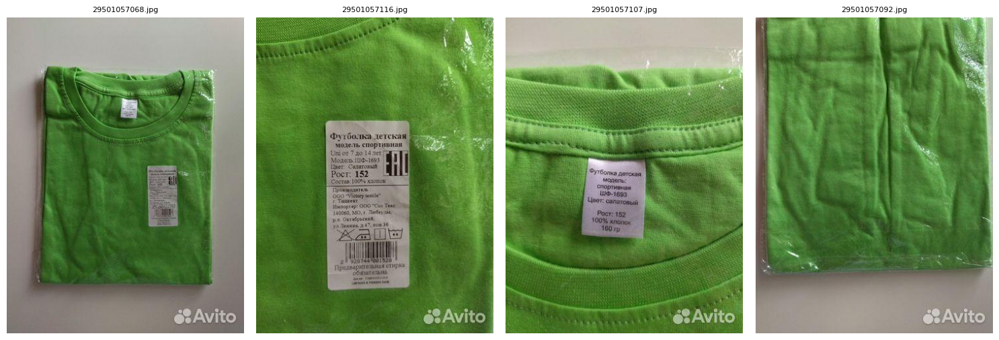

description: новая футболка на физкультуру, даже не открывали упаковку. брала на вырост, но не понадобилась. салатный цвет, рост 152. куплена в магазине Sky lake на Проспекте Октября. подходит для Лицея √ 1. могу передать в Лицей, чтобы оттуда забрать
other: Новая зелёная футболка для мальчиков, идеально подходит для занятий физкультурой. Размер 152 см, рассчитана на возраст 12 лет. Изготовлена из 100% хлопка, что обеспечивает комфорт и воздухопроницаемость. Футболка в оригинальной упаковке, не использовалась.


In [15]:
random_rows = df.sample(n=5, random_state=RANDOM_STATE)
for _, row in random_rows.iterrows():
    display_ad(row, columns_to_display=['description', 'other'])

Видно, что все-таки человеческие описани объявлений более информативные

Например:

- 'куплена в магазине Sky lake на Проспекте Октября. подходит для Лицея √ 1. могу передать в Лицей, чтобы оттуда забрать' - это человеческое описание, вдруг для покупателя это была очень важная информация, но GPT4 не указал ее

-  ' На узкую ногу.' - это человеческое описание, но GPT4 не указал ее. Возможно, это критически важная информация для покупателя

- 'Могу отдать в подарок при покупке любой вещи' - это человеческое описание. Некоторые люди используют Авито не только как площадку для продажи, но и как площадку для обмена, дарения и пр.

Посмотрим на длины описаний

In [16]:
df_experimental = df.copy()
df_experimental['description_length'] = df_experimental['description'].str.len()
df_experimental['other_length'] = df_experimental['other'].str.len()

In [17]:
print('╭' + '─' * 63 + '╮')
print(f"│ {'Метрика':<33}│ {'Человек':<13}│ {'GPT-4':<12}│")
print('├' + '─' * 34 + '┼' + '─' * 14 + '┼' + '─' * 13 + '┤')

print(f"│ {'Максимальная длина (символов)':<33}│ {df_experimental['description_length'].max():<13}│ {df_experimental['other_length'].max():<12}│")
print(f"│ {'Минимальная длина (символов)':<33}│ {df_experimental['description_length'].min():<13}│ {df_experimental['other_length'].min():<12}│")
print(f"│ {'Средняя длина (символов)':<33}│ {df_experimental['description_length'].mean():<13.2f}│ {df_experimental['other_length'].mean():<12.2f}│")
print(f"│ {'Медианная длина (символов)':<33}│ {df_experimental['description_length'].median():<13}│ {df_experimental['other_length'].median():<12}│")

human_vocab = len(set(' '.join(df_experimental["description"].dropna()).split()))
gpt_vocab = len(set(' '.join(df_experimental["other"].dropna()).split()))

print(f"│ {'Размер словаря (слов)':<33}│ {human_vocab:<13}│ {gpt_vocab:<12}│")

print('╰' + '─' * 63 + '╯')

╭───────────────────────────────────────────────────────────────╮
│ Метрика                          │ Человек      │ GPT-4       │
├──────────────────────────────────┼──────────────┼─────────────┤
│ Максимальная длина (символов)    │ 499          │ 769         │
│ Минимальная длина (символов)     │ 101          │ 42          │
│ Средняя длина (символов)         │ 164.46       │ 308.62      │
│ Медианная длина (символов)       │ 142.0        │ 303.0       │
│ Размер словаря (слов)            │ 91401        │ 33731       │
╰───────────────────────────────────────────────────────────────╯


Видим, что тексты от GPT4 почти в 2 раза длиннее, чем человеческие.

При этом, средние и медианные значения, что у людей, что у GPT4, не отличаются. Значит на выбросы этот фактор не влияет.

Размер словаря человека в 3 раза больше, чем у GPT4. Это может быть из-за опечаток человека или из-за ограниченного словаря GPT4.

Макимальные и минимальные длины дают понять, что пустых строк скорее всего нет

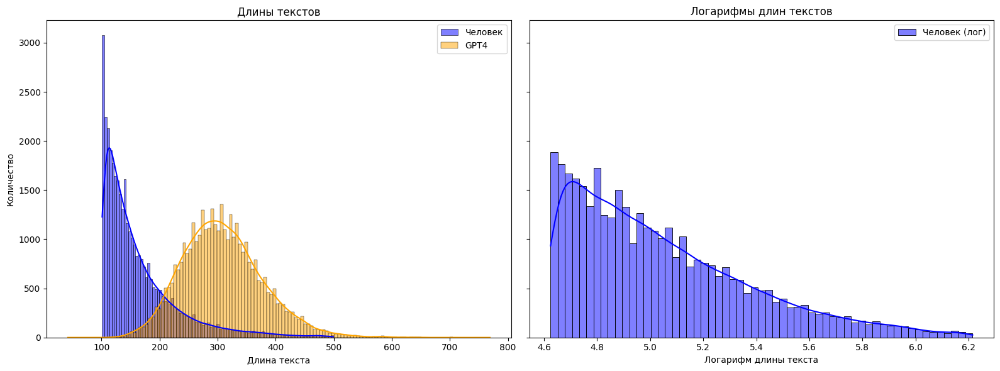

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

sns.histplot(df_experimental['description_length'], color='blue', label='Человек', kde=True, ax=axes[0])
sns.histplot(df_experimental['other_length'], color='orange', label='GPT4', kde=True, ax=axes[0])
axes[0].set_title('Длины текстов')
axes[0].set_xlabel('Длина текста')
axes[0].set_ylabel('Количество')
axes[0].legend()

filtered = df_experimental[(df_experimental['description_length'] > 100) & (df_experimental['other_length'] > 100)]
sns.histplot(np.log1p(filtered['description_length']), color='blue', label='Человек (лог)', kde=True, ax=axes[1])
axes[1].set_title('Логарифмы длин текстов')
axes[1].set_xlabel('Логарифм длины текста')
axes[1].set_ylabel('Количество')
axes[1].legend()

plt.tight_layout()
plt.show()

Человеческие описания (синий график):

- Распределение длины текстов имеет пик около 100–150 символов
- Большинство текстов короткие, с резким спадом после 200 символов

GPT-4 описания (оранжевый график):

- Распределение более равномерное, с пиком около 300 символов
- GPT-4 генерирует более длинные тексты, чем люди, с плавным спадом после 400 символов


Перекрытие между распределениями минимально, что подчеркивает различие в стилях написания

Сначала может показаться, что распределение длин человеческих текстов - логнормальное, но как видно на графике - взятие логарифма не приводит к нормальному распределению. Значит гипотеза ошибочна

Как категория влияет на длину объявления

In [19]:
df_experimental['mapped_category'] = df_experimental['category'].replace(CAT_MAP)

for category in sorted(df_experimental['mapped_category'].unique()):
    category_data = df_experimental[df_experimental['mapped_category'] == category]
    
    print(f'Категория: {category}')
    print('╭' + '─' * 58 + '╮')
    print(f'│ {"Метрика":<33}│ {"Человек":<10}│ {"GPT-4":<10}│')
    print('├' + '─' * 34 + '┼' + '─' * 11 + '┼' + '─' * 11 + '┤')
    
    print(f'│ {"Максимальная длина":<33}│ {category_data["description_length"].max():<10}│ {category_data["other_length"].max():<10}│')
    print(f'│ {"Минимальная длина":<33}│ {category_data["description_length"].min():<10}│ {category_data["other_length"].min():<10}│')
    print(f'│ {"Средняя длина":<33}│ {category_data["description_length"].mean():<10.2f}│ {category_data["other_length"].mean():<10.2f}│')
    print(f'│ {"Медианная длина":<33}│ {category_data["description_length"].median():<10}│ {category_data["other_length"].median():<10}│')
    
    human_vocab = len(set(' '.join(category_data['description'].dropna()).split()))
    gpt_vocab = len(set(' '.join(category_data['other'].dropna()).split()))
    
    print(f'│ {"Размер словаря":<33}│ {human_vocab:<10}│ {gpt_vocab:<10}│')
    
    print('╰' + '─' * 58 + '╯\n')

Категория: (Ж) Платья и юбки
╭──────────────────────────────────────────────────────────╮
│ Метрика                          │ Человек   │ GPT-4     │
├──────────────────────────────────┼───────────┼───────────┤
│ Максимальная длина               │ 499       │ 549       │
│ Минимальная длина                │ 101       │ 112       │
│ Средняя длина                    │ 164.56    │ 307.89    │
│ Медианная длина                  │ 143.5     │ 304.0     │
│ Размер словаря                   │ 18629     │ 9316      │
╰──────────────────────────────────────────────────────────╯

Категория: (М) Рубашки
╭──────────────────────────────────────────────────────────╮
│ Метрика                          │ Человек   │ GPT-4     │
├──────────────────────────────────┼───────────┼───────────┤
│ Максимальная длина               │ 499       │ 615       │
│ Минимальная длина                │ 101       │ 90        │
│ Средняя длина                    │ 161.62    │ 289.86    │
│ Медианная длина               

Во всех категориях GPT-4 стабильно пишет почти в 2 раза длиннее человека, использует в 1.5–2 раза меньше уникальных слов. Человек пишет короче, разнообразнее, а GPT-4 беднее. Средняя длина текстов GPT-4 выше, медианная тоже, но минимальная длина иногда ниже, что странно. Размер словаря у человека значительно больше, что говорит о более богатом языке. GPT-4 упрощает текст, но делает его более объемным.

In [20]:
df_experimental['mapped_category'] = df_experimental['category'].replace(CAT_MAP)

stats = ['Максимальная длина', 'Минимальная длина', 'Средняя длина', 'Медианная длина', 'Размер словаря']
results = defaultdict(dict)

for category in df_experimental['mapped_category'].unique():
    cat_data = df_experimental[df_experimental['mapped_category'] == category]

    results['Максимальная длина']['Человек', category] = cat_data['description_length'].max()
    results['Максимальная длина']['GPT-4', category] = cat_data['other_length'].max()
    
    results['Минимальная длина']['Человек', category] = cat_data['description_length'].min()
    results['Минимальная длина']['GPT-4', category] = cat_data['other_length'].min()
    
    results['Средняя длина']['Человек', category] = cat_data['description_length'].mean()
    results['Средняя длина']['GPT-4', category] = cat_data['other_length'].mean()
    
    results['Медианная длина']['Человек', category] = cat_data['description_length'].median()
    results['Медианная длина']['GPT-4', category] = cat_data['other_length'].median()
    
    results['Размер словаря']['Человек', category] = len(set(' '.join(cat_data['description'].dropna()).split()))
    results['Размер словаря']['GPT-4', category] = len(set(' '.join(cat_data['other'].dropna()).split()))


print('Категории с экстремумами')
print('╭' + '─' * 94 + '╮')
print(f'│ {"Метрика":<25}│ {"Тип":<10}│ {"Категория (макс)":<25}│ {"Категория (мин)":<27}│')
print('├' + '─' * 26 + '┼' + '─' * 11 + '┼' + '─' * 26 + '┼' + '─' * 28 + '┤')

for stat in stats:
    for typ in ['Человек', 'GPT-4']:
        all_cats = {k[1]: v for k, v in results[stat].items() if k[0] == typ}
        max_cat = max(all_cats, key=all_cats.get)
        min_cat = min(all_cats, key=all_cats.get)
        print(f'│ {stat:<25}│ {typ:<10}│ {max_cat:<25}│ {min_cat:<27}│')

print('╰' + '─' * 94 + '╯')

Категории с экстремумами
╭──────────────────────────────────────────────────────────────────────────────────────────────╮
│ Метрика                  │ Тип       │ Категория (макс)         │ Категория (мин)            │
├──────────────────────────┼───────────┼──────────────────────────┼────────────────────────────┤
│ Максимальная длина       │ Человек   │ (МЖ) Комбинезоны         │ (МЖ) Пиджаки и костюмы     │
│ Максимальная длина       │ GPT-4     │ (МЖ) Верхняя одежда      │ (Ж) Платья и юбки          │
│ Минимальная длина        │ Человек   │ (МЖ) Обувь               │ (МЖ) Обувь                 │
│ Минимальная длина        │ GPT-4     │ (МЖ) Пиджаки и костюмы   │ (МЖ) Обувь                 │
│ Средняя длина            │ Человек   │ (МЖ) Комбинезоны         │ (МЖ) Свитеры и толстовки   │
│ Средняя длина            │ GPT-4     │ (МЖ) Верхняя одежда      │ (М) Футболки и майки       │
│ Медианная длина          │ Человек   │ (МЖ) Комбинезоны         │ (МЖ) Обувь                 │
│ Мед

Интересности:

- Самый большой размер словаря (при этом не максимальная длина текста) у категории "(М) Рубашки" - это касается и человека, и GPT4. 
  Это странно, ведь эта категория затрагивает лишь один пол, а не оба.

- Минимальная длина и словарь у категории "(МЖ) Обувь" - это касается и человека, и GPT4. 
  Люди скудно описывают обувь, которую продают

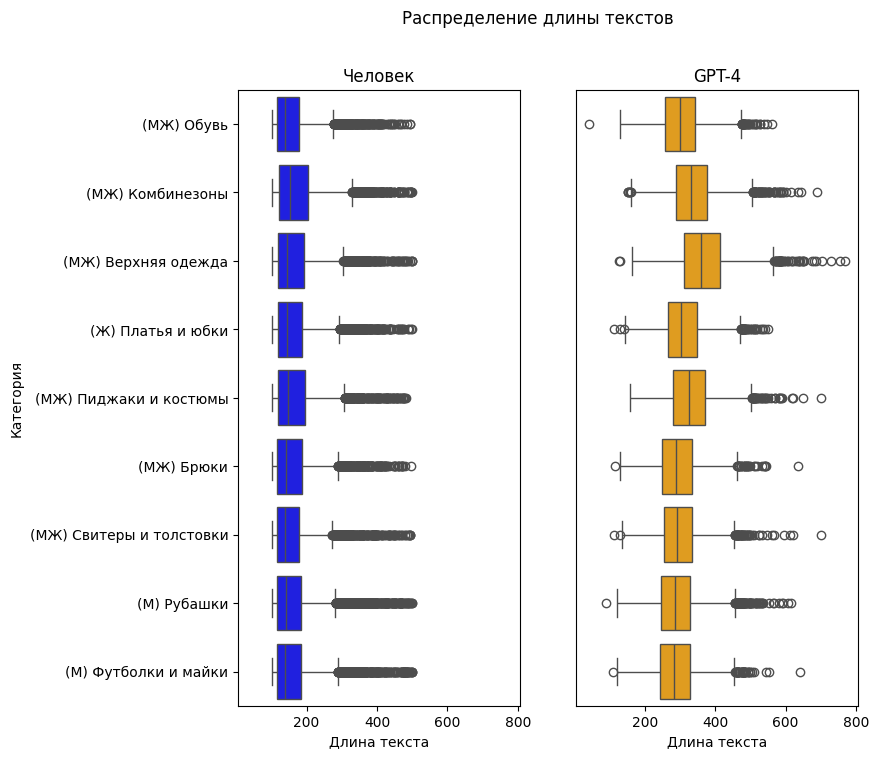

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(8, 8), sharex=True)

sns.boxplot(ax=axes[0], y='mapped_category', x='description_length',
            data=df_experimental, color='blue')
axes[0].set_title('Человек')
axes[0].set_xlabel('Длина текста')
axes[0].set_ylabel('Категория')

sns.boxplot(ax=axes[1], y='mapped_category', x='other_length',
            data=df_experimental, color='orange')
axes[1].set_title('GPT-4')
axes[1].set_xlabel('Длина текста')
axes[1].set_ylabel('')
axes[1].tick_params(axis='y', left=False, labelleft=False)

fig.suptitle('Распределение длины текстов')
plt.show()

На графике видно, что тексты GPT-4 (оранжевые боксплоты) значительно длиннее, чем у человека (синие боксплоты) во всех категориях. 

У GPT-4 распределение более равномерное, с меньшим количеством выбросов, тогда как у человека тексты короче и имеют больше выбросов. 

Особенно заметна разница в категориях (МЖ) Верхняя одежда и (МЖ) Комбинезоны, где GPT-4 генерирует самые длинные описания. У человека тексты более компактны, на нормальное распределение не похожи

Как пол влияет на длину объявления

In [22]:
df_experimental['mapped_sex'] = df_experimental['category'].replace(SEX_MAP)

for sex in sorted(df_experimental['mapped_sex'].unique()):
    sex_data = df_experimental[df_experimental['mapped_sex'] == sex]
    
    print(f'Пол: {sex}')
    print('╭' + '─' * 58 + '╮')
    print(f'│ {"Метрика":<33}│ {"Человек":<10}│ {"GPT-4":<10}│')
    print('├' + '─' * 34 + '┼' + '─' * 11 + '┼' + '─' * 11 + '┤')
    
    print(f'│ {"Максимальная длина":<33}│ {sex_data["description_length"].max():<10}│ {sex_data["other_length"].max():<10}│')
    print(f'│ {"Минимальная длина":<33}│ {sex_data["description_length"].min():<10}│ {sex_data["other_length"].min():<10}│')
    print(f'│ {"Средняя длина":<33}│ {sex_data["description_length"].mean():<10.2f}│ {sex_data["other_length"].mean():<10.2f}│')
    print(f'│ {"Медианная длина":<33}│ {sex_data["description_length"].median():<10}│ {sex_data["other_length"].median():<10}│')
    
    human_vocab = len(set(' '.join(sex_data['description'].dropna()).split()))
    gpt_vocab = len(set(' '.join(sex_data['other'].dropna()).split()))
    
    print(f'│ {"Размер словаря":<33}│ {human_vocab:<10}│ {gpt_vocab:<10}│')
    
    print('╰' + '─' * 58 + '╯\n')

Пол: Ж
╭──────────────────────────────────────────────────────────╮
│ Метрика                          │ Человек   │ GPT-4     │
├──────────────────────────────────┼───────────┼───────────┤
│ Максимальная длина               │ 499       │ 702       │
│ Минимальная длина                │ 101       │ 90        │
│ Средняя длина                    │ 164.46    │ 311.10    │
│ Медианная длина                  │ 143.0     │ 306.0     │
│ Размер словаря                   │ 60130     │ 24512     │
╰──────────────────────────────────────────────────────────╯

Пол: М
╭──────────────────────────────────────────────────────────╮
│ Метрика                          │ Человек   │ GPT-4     │
├──────────────────────────────────┼───────────┼───────────┤
│ Максимальная длина               │ 499       │ 769       │
│ Минимальная длина                │ 101       │ 42        │
│ Средняя длина                    │ 164.46    │ 305.78    │
│ Медианная длина                  │ 142.0     │ 301.0     │
│ Размер 

Достаточно необычно:

- для обоих полов значения максимальной, минимальной, средней и медианной длины для человека совпадают, у GPT4 - нет

Явных ошибок в коде пока не замечено, возможно такой способ получения пола из данных не совсем хорошо отражает реальный пол человека, писавшего объявление

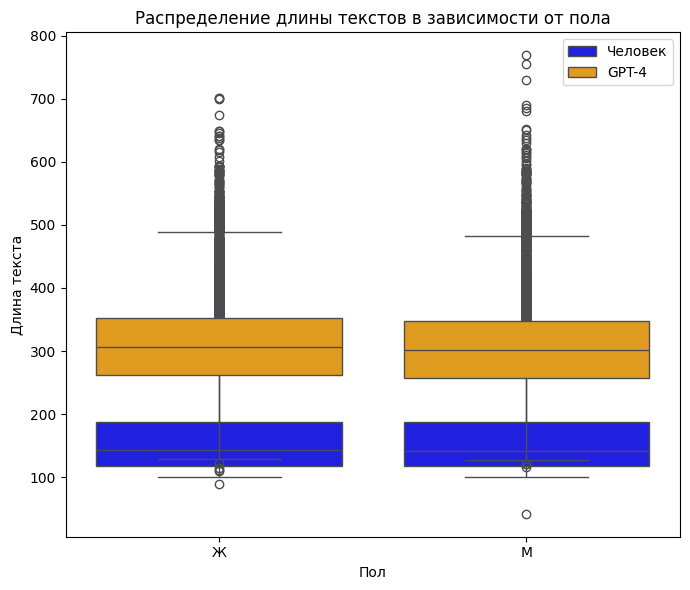

In [23]:
plt.figure(figsize=(7, 6))
sns.boxplot(x='mapped_sex', y='description_length', data=df_experimental,
            color='blue', label='Человек')
sns.boxplot(x='mapped_sex', y='other_length', data=df_experimental,
            color='orange', label='GPT-4')
plt.title('Распределение длины текстов в зависимости от пола')
plt.xlabel('Пол')
plt.ylabel('Длина текста')
plt.tight_layout()
plt.show()

Человек: Длины текстов распределены более компактно, медиана находится около 150 символов. Выбросы минимальны, и тексты редко превышают 200 символов.

GPT-4: Тексты более длинные, медиана около 300 символов, а максимальные значения достигают 700 символов. Также наблюдается больше выбросов, что указывает на генерацию более длинных текстов в отдельных случаях.

Различий между полами в длине текстов как у человека, так и у GPT-4 практически нет. Это может говорить о том, что стиль написания текстов не зависит от пола (который мы определили по категории), хотя в реальности это может быть не так, но у нас нет других данных о поле в датасете.

Посмотрим на частотность слов

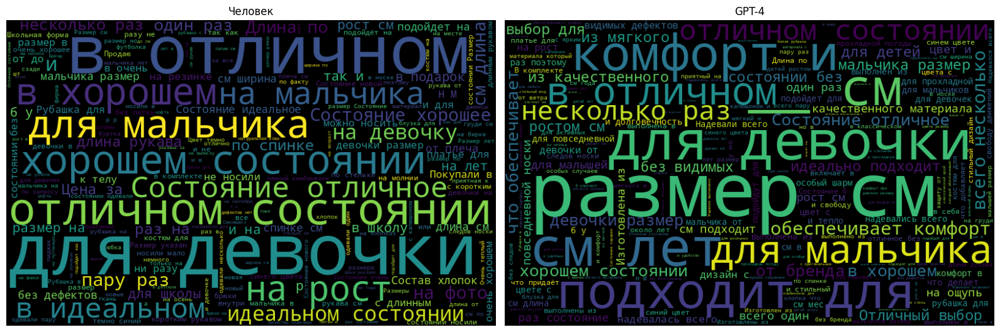

In [24]:
human_texts = ' '.join(df_experimental['description'].dropna())
human_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(human_texts)

gpt_texts = ' '.join(df_experimental['other'].dropna())
gpt_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(gpt_texts)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(human_wordcloud, interpolation='bilinear')
axes[0].axis('off')
axes[0].set_title('Человек')

axes[1].imshow(gpt_wordcloud, interpolation='bilinear')
axes[1].axis('off')
axes[1].set_title('GPT-4')

plt.tight_layout()
plt.show()

Человеческие описания:

- Часто встречаются слова, связанные с состоянием товара, например: "в хорошем/отличном/идеальном состоянии"
- Упоминаются конкретные детали, такие как "для девочки", "для мальчика", "размер", "длина", "см".

GPT-4 описания:

- Часто используются слова, связанные с универсальными характеристиками, например: "размер", "см", "подходит", "комфорт".
- Тексты более формализованы и стандартизированы, что может указывать на ограниченный словарный запас.

+ Кажется, что в этом датасете много детской одежды

In [25]:
# ~ 16 минут

human_texts = ' '.join(df_experimental['description'].dropna())
gpt_texts = ' '.join(df_experimental['other'].dropna())

lemmatized_human_texts = lemmatize_text(human_texts)
lemmatized_gpt_texts = lemmatize_text(gpt_texts)

human_words = lemmatized_human_texts.split()
gpt_words = lemmatized_gpt_texts.split()

human_word_counts = Counter(human_words)
gpt_word_counts = Counter(gpt_words)

human_top_10_percent = set([word for word, _ in human_word_counts.most_common(int(len(human_word_counts) * 0.1))])
gpt_top_10_percent = set([word for word, _ in gpt_word_counts.most_common(int(len(gpt_word_counts) * 0.1))])

common_words = human_top_10_percent.intersection(gpt_top_10_percent)

print(f'Общее количество слов в топ-10% у человека: {len(human_top_10_percent)}')
print(f'Общее количество слов в топ-10% у GPT-4: {len(gpt_top_10_percent)}')
print(f'Количество совпадающих слов: {len(common_words)}')
print(f'Процент совпадения: {len(common_words) / len(human_top_10_percent) * 100:.2f}%')
print(f'Совпадающие слова: {list(common_words)}')

Общее количество слов в топ-10% у человека: 1889
Общее количество слов в топ-10% у GPT-4: 919
Количество совпадающих слов: 777
Процент совпадения: 41.13%
Совпадающие слова: ['гибкий', 'однотонный', 'штрипка', 'полоса', 'кружево', 'закрыть', 'линия', 'слой', 'течение', 'танец', 'очаровательный', 'цена', 'особенно', 'галстук', 'как', 'белый', 'кадетский', 'полуботинок', 'использовать', 'модница', 'плюшевый', 'маломерить', 'разный', 'интересный', 'вариант', 'отлично', 'отличный', 'маленький', 'benetton', 'воздушный', 'эффект', 'этикетка', 'футер', 'waikiki', 'предлагать', 'насыщенный', 'полосатый', 'открытый', 'подошва', 'мятный', 'crocs', 'школа', 'пайетка', 'за', 'кармашек', 'некоторый', 'отворот', 'свой', 'кофточка', 'еще', 'искусственный', 'кофта', 'удобный', 'стопа', 'стиль', 'аппликация', 'держать', 'б', 'шорты', 'абсолютно', 'закрытый', 'голова', 'ощупь', 'при', 'свитер', 'весь', 'юный', 'менять', 'накладный', 'выглядеть', 'вырез', 'яркий', 'отсутствовать', 'disney', 'руб', 'хотя',

GPT-4 использует меньше уникальных слов, чем человек, что указывает на более ограниченный словарный запас. 

Совпадающих слов не много (41%), что говорит о слабой схожести в стилях написания у человека и GPT-4

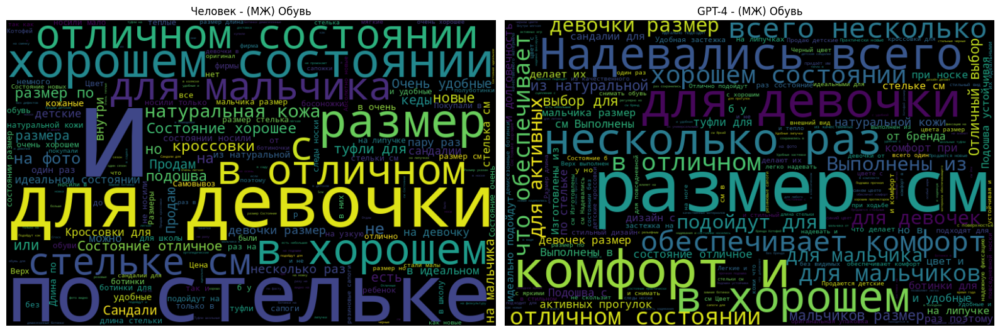

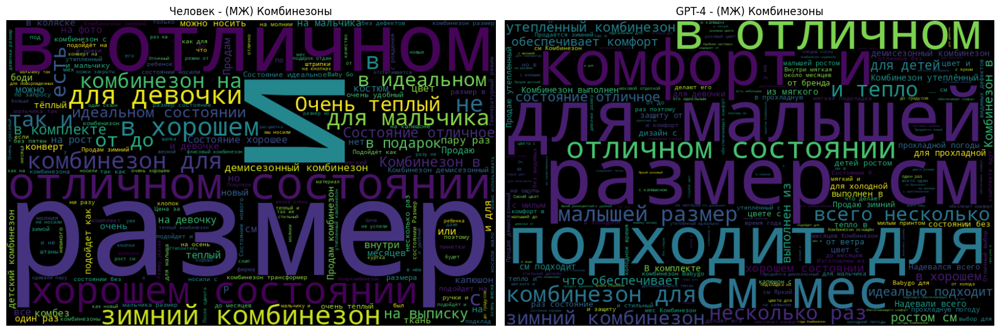

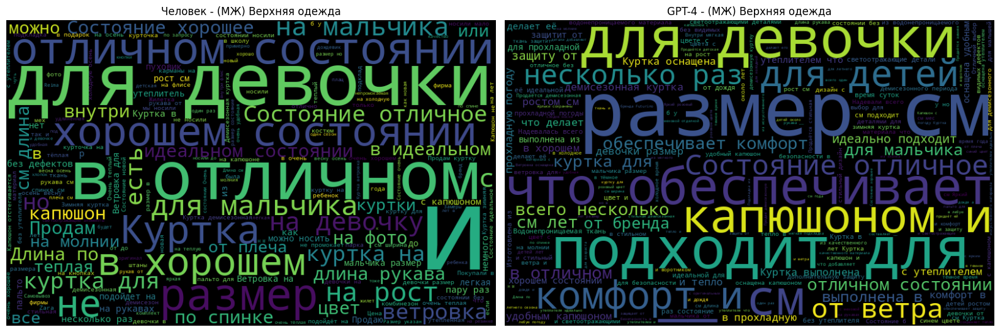

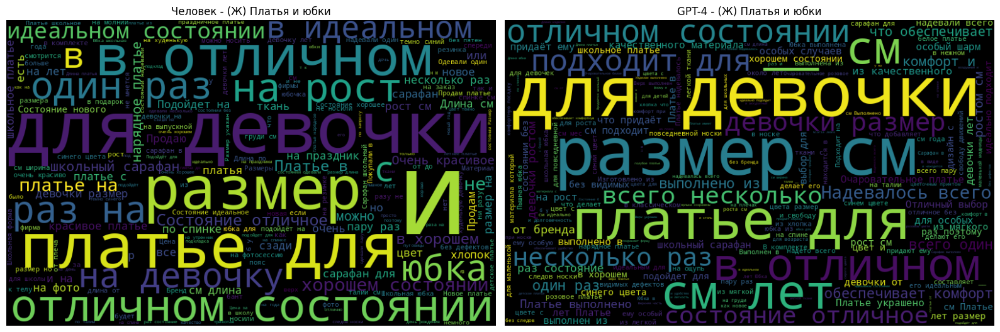

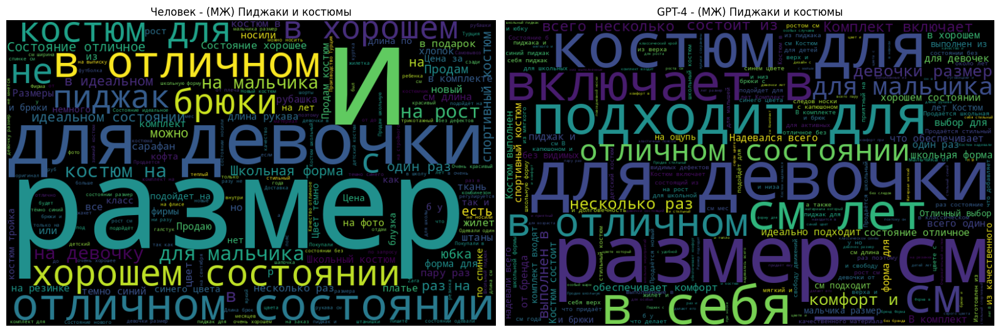

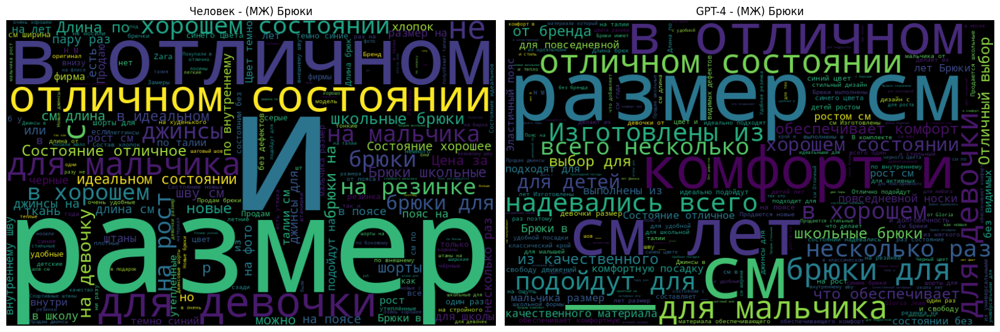

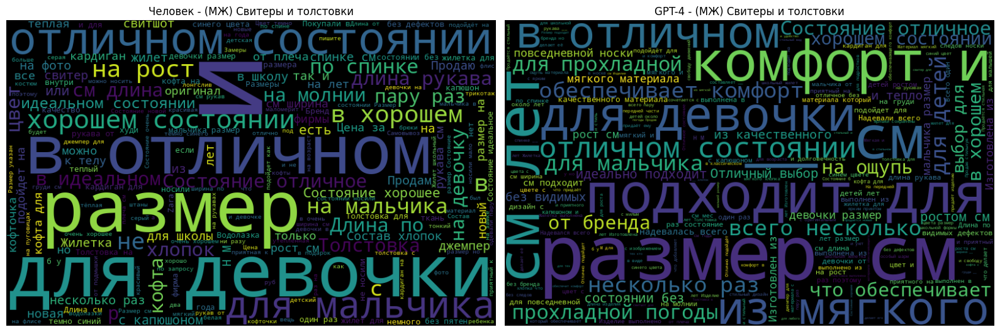

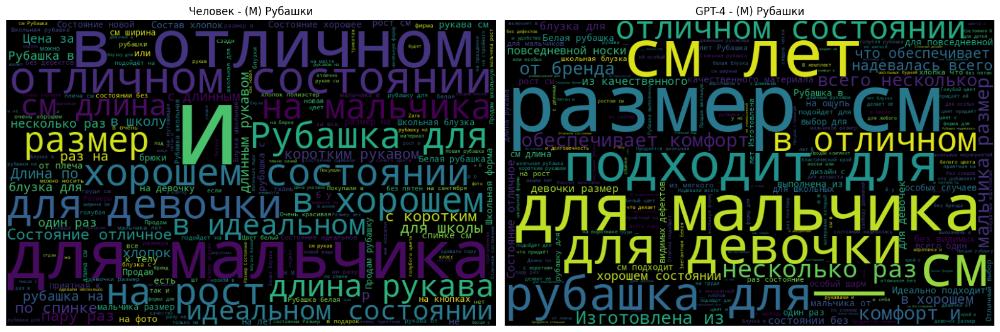

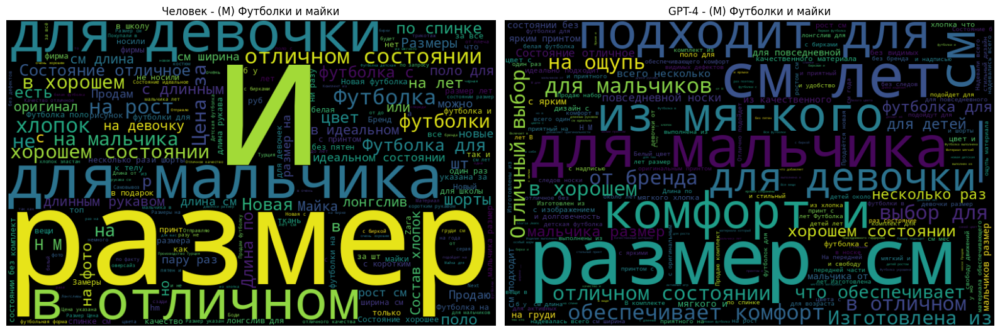

In [26]:
for category in df_experimental['mapped_category'].unique():
    category_texts = ' '.join(df_experimental[df_experimental['mapped_category'] == category]['description'].dropna()) + ' ' + \
                     ' '.join(df_experimental[df_experimental['mapped_category'] == category]['other'].dropna())
    
    human_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(' '.join(df_experimental[df_experimental['mapped_category'] == category]['description'].dropna()))
    gpt_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(' '.join(df_experimental[df_experimental['mapped_category'] == category]['other'].dropna()))
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    axes[0].imshow(human_wordcloud, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'Человек - {category}')
    
    axes[1].imshow(gpt_wordcloud, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'GPT-4 - {category}')
    
    plt.tight_layout()
    plt.show()

По этим графикам тяжело однозначно говорить про отличия ключевых слов у людей и GPT-4.

Продолжим анализировать

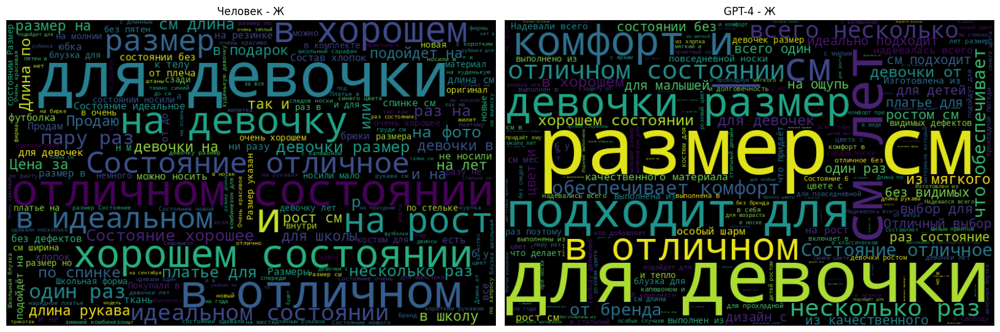

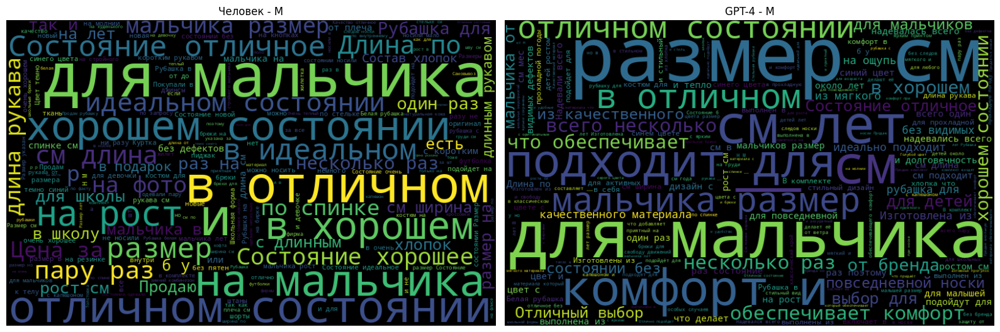

In [27]:
for sex in df_experimental['mapped_sex'].unique():
    human_texts = ' '.join(df_experimental[df_experimental['mapped_sex'] == sex]['description'].dropna())
    gpt_texts = ' '.join(df_experimental[df_experimental['mapped_sex'] == sex]['other'].dropna())
    
    human_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(human_texts)
    gpt_wordcloud = WordCloud(width=800, height=500, background_color='black').generate(gpt_texts)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    axes[0].imshow(human_wordcloud, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'Человек - {sex}')
    
    axes[1].imshow(gpt_wordcloud, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'GPT-4 - {sex}')
    
    plt.tight_layout()
    plt.show()

Опять нет явных отличий между GPT4 и человеком, зато видим отличия между категориями товаров по полу, что логично

#### 🔴 Углубимся в сравнение реальных и синтетических данных

Посмотрим на несколько примеров:

In [28]:
sample = df_experimental.sample(5, random_state=RANDOM_STATE)
for _, row in sample.iterrows():
    print(f'Текст от человека: {row["description"]}')
    print(f'Текст от GPT-4: {row["other"]}')
    print(f'Аттрибуты: {row["attrs"]}')
    print()

Текст от человека: Рубашка в клетку для мальчика размер 110. Состояние идеальное, надевали несколько раз. Рукава длинные , а можно подвернуть и зафиксировать.
Текст от GPT-4: Стильная рубашка в клетку для мальчика, размер 110 см, от бренда Button Blue. Синий цвет с ярким клетчатым узором придаёт ей особый шарм. Рубашка надевалась всего несколько раз, поэтому сохранила идеальное состояние. Длинные рукава можно подвернуть и зафиксировать, что добавляет удобства.
Аттрибуты: {'Предмет одежды': 'Рубашки', 'Вид одежды': 'Для мальчиков', 'Вид объявления': 'Продаю своё', 'Цвет': 'Синий', 'Размер. Одежда': '110 см (5 лет)', 'Бренд одежды': 'Button Blue', 'Тип предмета одежды': 'Верх', 'Как часто надевали?': 'Несколько раз'}

Текст от человека: Продам школьные брюки для мальчика на рост 122 см в хорошем состоянии. Цвет темно синий.
Колени и тд все целое не вытянутое. Ребенок носил аккуратно. 
Две пары одинаковых. Каждая пара по 600₽
Текст от GPT-4: Продаются школьные брюки для мальчика на рост 1

Какие сейчас есть претензии к синтетическим данным?

1. Иногда опускаются важные детали - например, пользователь хочет торговаться, обмениваться и прочее.
   Модель этого не опознает.

   Как можно решить: а надо ли вообще решать? Приветствуется ли Авито такая деятельность на их сайте?

2. Скудный словарный запас у GPT4.
   
   Даже после лемматизации, словари у человеческих и синтетических объявлений прилично отличаются.

3. Тексты от GPT4 значительно длиннее 

   Как можно решить: делать summary? перегенеририровать?

Проверим наши объявления на опечатки, сравним где их больше

In [7]:
%pip uninstall transformers huggingface-hub -y

Note: you may need to restart the kernel to use updated packages.


In [8]:
%pip install transformers==4.15.0 huggingface-hub==0.2.1

  Using cached transformers-4.15.0-py3-none-any.whl.metadata (59 kB)
  Using cached huggingface_hub-0.2.1-py3-none-any.whl.metadata (6.3 kB)
  Using cached sacremoses-0.1.1-py3-none-any.whl.metadata (8.3 kB)
  Using cached tokenizers-0.10.3.tar.gz (212 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Using cached transformers-4.15.0-py3-none-any.whl (3.4 MB)
Using cached huggingface_hub-0.2.1-py3-none-any.whl (61 kB)
Using cached sacremoses-0.1.1-py3-none-any.whl (897 kB)
  error: subprocess-exited-with-error
  
  × Building wheel for tokenizers (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [62 lines of output]
      /tmp/pip-build-env-pdkoglp3/overlay/lib/python3.12/site-packages/setuptools/dist.py:759: SetuptoolsDeprecationWarning: License classifiers are deprecated.
      !!
      
              ********************************************************************************

In [9]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch

MODEL = "ai-forever/ruBert-base-gec"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSeq2SeqLM.from_pretrained(MODEL)

def check_texts_for_errors(texts, batch_size=16):
    results = []
    for i in tqdm(range(0, len(texts), batch_size)):
        batch = texts[i:i+batch_size]
        inputs = tokenizer(batch, return_tensors="pt", padding=True, truncation=True, max_length=128)
        with torch.no_grad():
            outputs = model.generate(**inputs, max_new_tokens=128)
        decoded = tokenizer.batch_decode(outputs, skip_special_tokens=True)
        # ошибка если текст исправился (модель исправила)
        batch_has_error = [orig != corr for orig, corr in zip(batch, decoded)]
        results.extend(batch_has_error)
    return results

ModuleNotFoundError: No module named 'transformers'

In [10]:
texts = df["description"].astype(str).tolist() + df["other"].astype(str).tolist()

NameError: name 'df' is not defined

In [ ]:
has_error = check_texts_for_errors(texts)

N = len(df)
df["desc_has_error"] = has_error[:N]
df["other_has_error"] = has_error[N:]

print(df[["desc_has_error", "other_has_error"]].value_counts())

Итак, можно ли добавлять синтетические объявления во время тренировки?
- Да, но с оговоркой - нельзя перебарщивать их количеством. Скорее всего, мы этого делать не будем

##### Предобученные модели

Когда мы проверяли наш датасет на опечатки, мы не спроста привлекли предобученную модель.

Важен вопрос, как можно использовать их во время решения нашей задачи?

Мы будем использовать предобученные модели в двух направлениях:

1. Модерация загружаемого в сервис контента (модерация текстов и изображений)

    Тут мы выбрали две легчайшие модели (так как наша основная модель и так тяжела)
    - Модерация фото - notAI-tech/NudeNet                             
    - Модерация текста - unitary/toxic-bert (multilingual) или cointegrated/rubert-tiny-toxicity


2. Генерация признака разнообразности товаров (diversity)

    Мы планируем обучить классификатор, который будет определять, насколько сильно разные товары представлены в одном объявлении.
    
    Далее мы будем подавать модели признак `is_diversity` как скрытый токен. Это очень важный токен, ведь от него зависит стиль написания текста.

### 🔴 Заголовки объявлений (`title`)

CtrlC CtrlV взять описания, убрать ГПТ оттуда и лишнюю инф

### 🔴 Параметры объявлений (`attrs`), подготовка масок

In [ ]:
# анализ df attrs. есть ли пустые? какие уникальные, какие чаще встречаются? и так далее
# вывести каждый attr и значения в нем

# ...attrs - это словари мета признаков у объявления если что

### 🔴 Изображения (`images`, `item_id`)

In [ ]:
# используя функцию display_ad строить картинки

сколько на одно объявление картинок - сделай распределение

битые картинки есть?

какие размеры у картинок?

попробовать аугментации, какие будут уместны?

Поговорить про изображения:

- Всегда ли по картинке можно однозначно определить ответ?
  Пример. Среди 20-ти вручную просмотренных картинок номер легко читался и
  совпадал с указанным в целевой переменной.

- В каком разрешении нужно решать задачу? Будут ли видны объекты в том 
  разрешении, в котором вы будете подавать картинки в нейронную сеть?

- Есть ли дисбаланс по визуальным признакам среди классов?
  Пример. Вы обучаете модель определения марки и модели авто по фото, в вашем 
  датасете встречаются только красные жигули. Это может привести к тому, что 
  жигули другого цвета не будут верно распознаны моделью.

- Какие аугментации можно использовать? Покажи.
  Пример. В случае считывания текста с картинок с госномером нельзя использовать
  вертикальное и горизонтальное отражение. Изменение яркости, контраста,
  небольшие приближения и повороты могут повысить точность предсказаний.

## Углубленный анализ

### Датасет в этой задаче


Задача:

Обучить модель, которая по заголовку и входным параметрам будет генерировать
описание объявления. 
Придумать, как в модель добавлять информацию с картинок, которые были приложены 
к объявлению.

Датасет для этого подходит, но с важной оговоркой:

**В датасете представлена только одежда, а не другие категории товаров.**

Мы однозначно будем плохо работать на других категориях товаров, например, на электронике.

Однако есть очевидный плюс - наличие сгенерированных объявлений от GPT4.

Продемонстрируй их и дай комментарии по этим особенностям:

!!! Есть часть айтемов, где внутри продаётся несколько товаров (например, много
футболок, много рубашек и тд). Даже самые лучшие решения дурят на таких кейсах,
там вряд ли получится выбить хорошее качество. Тут либо их пофильтровать и просто
выкинуть из обучения, либо придумать, как выдавать и не совсем детальное описание,
и не сильно ошибочное.

!!! В части описаний (как реальных, так и сгенерированных) есть реально указанные
размеры, например длина по спине 45 см. Учиться на таком нельзя, поскольку моделька
заранее не знает, какой будет размер у товара, и всегда будет галлюцинировать в этом месте. 
Тут тоже надо что-то придумать, мы например маскируем эти числа символом __, чтобы 
дать понять юзеру, что туда надо вписать реальный размер.

!!! Почти во всех айтемах больше одной картинки. Учиться на всех картинках или брать
только одну (например первую) - решать вам. Есть архитектуры, которые могут и с одной
картинкой работать, и со многими. 

Тут зависит от того, сможете ли вы найти и применить нужное решение, но
по-хорошему нужно конечно учиться на всех, тк там может быть больше полезной инфы.



- Понять, от чего и как зависит целевая переменная
  Пример. На графике видно, что зависимость признака j с целевой переменной 
  нелинейна, поэтому вы понимаете, что использовать его в линейной модели без 
  предобработки не стоит. 

- Сгенерировать новые идеи (фантазируй)

- Можно ли сгенерировать синтетические данные или использовать открытые данные
  для предобучения?
  Пример. В случае считывания текста госномера с картинок, можно предобучать
  модель на синтетических данных: сгенерировать картинки номеров, подобрав
  похожий шрифт и используя то же взаимное расположение цифр и букв. 


  Есть открытый датасет авито с соревнования - 


  Здесь ты проводишь чуть меньше анализа. Это дополнительный датасет.
Скачай и распакуй датасет сюда: /root/AAAproj/data/kaggle_dataset

Это очень большой датасет, будь аккуратен с его сборкой, он состоит
из нескольких частей, продумай код тщательно перед скачиванием, не 
забудь удалить за собой архивы, если ты уже их распаковал!

Это датасет с соревнования, откуда ты возьмешь только тренировочную часть.

Тренировочные данные

- train_part_[0001-0004].snappy.parquet

   выборка для обучения, содержащая 1.87 миллионов пар объявлений 
   (4 файла по ~500 тыс. объявлений)


- train_images_part_[0001-0004]-chunk[0001-0008].zip

    2.5 миллиона изображений в формате JPEG для соответствующих объявлений 
    (30 файлов по ~100 тыс. изображений)


Имя колонки             Тип         Описание

base_item_id	        str	        id опорного объявления
cand_item_id	        str	        id объявления-кандидата
group_id	            int	        Номер группы пользователей, к которой принадлежит пара объявлений (1)
action_date	            datetime	Дата (1)
base_category_name	    str	        Название категории опорного объявления
cand_category_name	    str	        Название категории объявления-кандидата
base_subcategory_name	str	        Название подкатегории опорного объявления
cand_subcategory_name	str	        Название подкатегории объявления-кандидата
base_param1	            str	        Первый уровень детализации подкатегории для опорного объявления
cand_param1	            str	        Первый уровень детализации подкатегории для объявления-кандидата
base_param2	            str	        Второй уровень детализации подкатегории для опорного объявления
cand_param2	            str	        Второй уровень детализации подкатегории для объявления-кандидата
base_title	            str	        Заголовок опорного объявления
cand_title	            str	        Заголовок объявления-кандидата
base_description	    str	        Описание опорного объявления
cand_description	    str	        Описание объявления-кандидата
base_price	            float	    Цена, указанная в опорном объявлении
cand_price	            float	    Цена, указанная в объявлении-кандидате
base_json_params	    str (json)	Атрибуты опорного объявления
cand_json_params	    str (json)	Атрибуты объявления-кандидата
base_count_images	    int	        Число фотографий в опорном объявлении
cand_count_images	    int	        Число фотографий в объявлении-кандидате
base_title_image	    str	        id титульной фотографии для опорного объявления
cand_title_image	    str	        id титульной фотографии для объявления-кандидата
is_same_location	    bool	    Флаг совпадения локации (город, село и пр.) для пары объявлений
is_same_region	        bool	    Флаг совпадения региона для пары объявлений
is_double	            bool	    Является ли пара объявлений дублем (1)

(1) Предоставляется только для тренировочной выборки

Поговори про то, как бы ты скомбинировал данные из датасетов.
Что делать с картинками? Что нужно дополнительно сделать с текстами?
Как бы ты скомбинировал данные из датасетов? В каких пропорциях, 
или как бы ты их перемешал?